<a href="https://colab.research.google.com/github/MartinR741/SDA-Final-project/blob/main/final_project_SDA_multiclass_image_classification_Dog_breed_identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classification


This notebook builds an multi-class image classifier using Tensorflow and Keras (transfer learning).




## Problem and Goal

problem - dog breed identification based on a picture, using ANN (CNN) and transfer learning (multiclass classification)

goal - upload a photo or picture of an unknown dog to this notebook and determine the breed using the trained model

## Data

The data we re using is from Kaggle s dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data



## Features

Some information about the data:
* We re dealing with images (unstructured data) so it s probably best we use deep learning/ transfer learning
* There are 120 breeds of dogs (this means there are 120 different classes).
* Ther are around 10 000+ images in the training set (these images have labels)
* There are around 10 000+ images in the test set (these images have no labels, because we ll want to predict them).

# Data unzip

the data from kaggle comes in zip format, so we need to unzip the data first, we will use this command only once

In [79]:
# Unzip the uploaded data into google drive
#!unzip "/content/drive/MyDrive/SDA Final project/dog-breed-identification.zip" -d "/content/drive/MyDrive/SDA Final project"

# Imports and extensions

In [1]:
import pandas as pd
from IPython.display import Image
import os
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
import datetime
import tensorflow_hub as hub
import requests
from PIL import Image
from IPython.display import Image



%load_ext tensorboard





# Data overview

## Labels

In [2]:
# Checkout the labels of our data

labels_csv = pd.read_csv("/content/drive/MyDrive/SDA Final project/labels.csv")
print(labels_csv.describe())
print(labels_csv.head(10))

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id               breed
0  000bec180eb18c7604dcecc8fe0dba07         boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97               dingo
2  001cdf01b096e06d78e9e5112d419397            pekinese
3  00214f311d5d2247d5dfe4fe24b2303d            bluetick
4  0021f9ceb3235effd7fcde7f7538ed62    golden_retriever
5  002211c81b498ef88e1b40b9abf84e1d  bedlington_terrier
6  00290d3e1fdd27226ba27a8ce248ce85  bedlington_terrier
7  002a283a315af96eaea0e28e7163b21b              borzoi
8  003df8b8a8b05244b1d920bb6cf451f9             basenji
9  0042188c895a2f14ef64a918ed9c7b64  scottish_deerhound


In [3]:
# How many images are there of each breed?
labels_csv["breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

<Axes: xlabel='breed'>

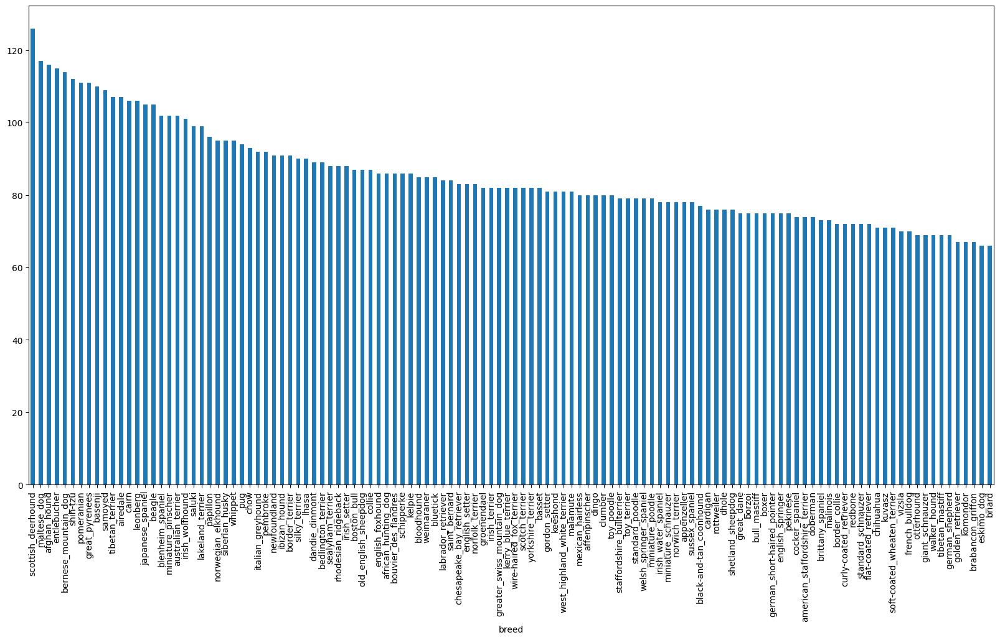

In [4]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [5]:
labels_csv["breed"].value_counts().mean()


85.18333333333334

In [6]:
labels_csv["breed"].value_counts().median()

82.0

## Images

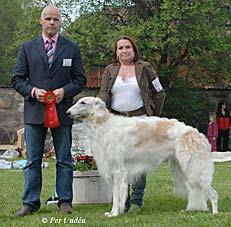

In [7]:
# Lets view an image

Image("/content/drive/MyDrive/SDA Final project/train/002a283a315af96eaea0e28e7163b21b.jpg")

# Getting images and their labels

Lets get a list of all out image file pathnames

In [8]:
labels_csv.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


In [9]:
# Create pathnames from image IDs
filenames = ["/content/drive/MyDrive/SDA Final project/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/SDA Final project/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/SDA Final project/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/SDA Final project/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/SDA Final project/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/SDA Final project/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/SDA Final project/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/SDA Final project/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/SDA Final project/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/SDA Final project/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/SDA Final project/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# Check if number of filenames matches with number of image files

if len(os.listdir("/content/drive/MyDrive/SDA Final project/train/")) == len(filenames):
  print("Yes")
else:
  print("No")

Yes


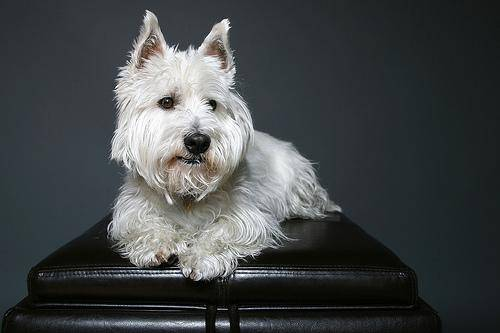

In [11]:
# One more check
Image(filenames[7676])

In [12]:
labels_csv["breed"][7676]

'west_highland_white_terrier'

## Since we ve now our training image filepaths in a list, lets prepare our labels

In [13]:
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Yes!")
else:
  print("No!.")

Yes!


In [16]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [17]:
len(unique_breeds)

120

In [18]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

# Creating our own validation set

Since the dataset from Kaggle doesnt come with a validation set, were going to create our own

In [19]:
# Setup X a y variables
X = filenames
y = boolean_labels

Were going to start off experimenting with 1000 images and increase as needed

In [20]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [21]:
# Lets split our data into train and validation sets of total size NUM_IMAGES

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [22]:
# Lets have a look at the training data
X_train[:2], y_train[:2]

(['/content/drive/MyDrive/SDA Final project/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/SDA Final project/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False,

# Preprocessing Images (turning images into tensors)

In [23]:
# Define image size, necessary because of the model, can be changed as needed
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  takes image filepath and changing in tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize zhe image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

# Turning data into batches

In [24]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [25]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if its training data but doesnt shuffle if its validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably dont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [26]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val)

Creating training data batches...
Creating training data batches...


## Visualizing Data Batches

In [27]:
# Create a function for viewing images in a data batch

def show_25_images(images, labels):
    """
    Displays a plot of 25 images and their labels from a data batch.
    """
    # Setup the figure
    plt.figure(figsize=(10, 10))
    # Loop through 25 (for displaying 25 images)
    for i in range(25):
        # Create subplots (5 rows, 5 columns)
        ax = plt.subplot(5, 5, i+1)
        # Remove axis labels
        ax.axis('off')
        # Display an image
        plt.imshow(images[i])
        # Add the image label as the title
        plt.title(unique_breeds[labels[i].argmax()])

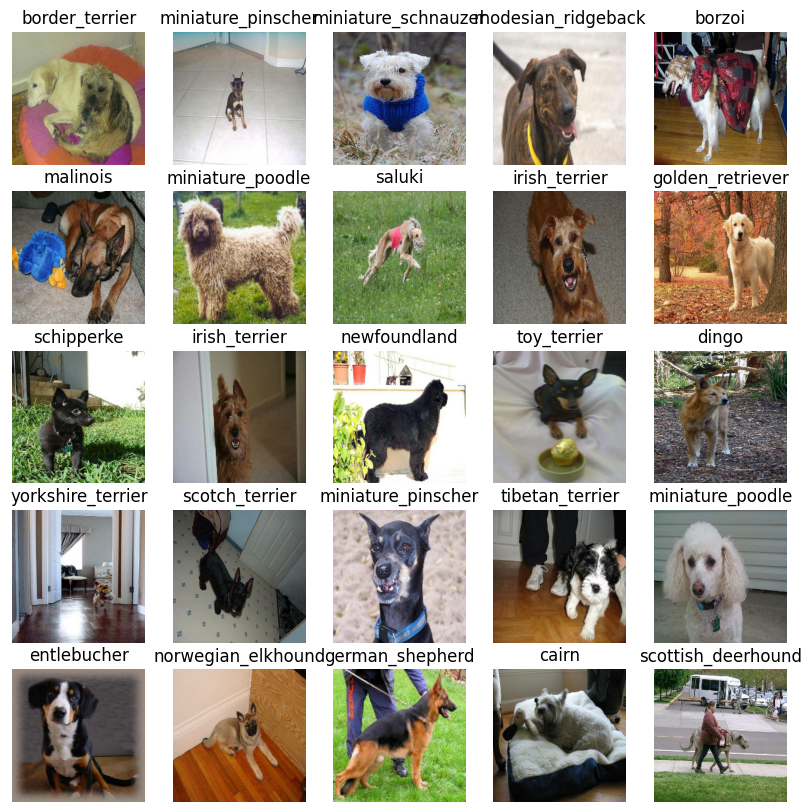

In [28]:
# visualizing the data in training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

# Building a model

In [29]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]  # batch,height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)


# Load MobileNet model
base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


17225924/17225924 [==============================] - 2s 0us/step


In [30]:
# Create a function which builds a model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, base_model=base_model):
    print("Building model with:", base_model)

    # Freeze the base model layers
    base_model.trainable = False

    # Setup the model layers
    model = Sequential([
        base_model,  # Layer 1: MobileNet (input layer)
        tf.keras.layers.GlobalAveragePooling2D(),  # Layer 2: Global Average Pooling (feature extractor)
        Dense(OUTPUT_SHAPE, activation='softmax')  # Layer 3: Dense (output layer)
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=['accuracy']
    )

    return model

# Create the model
model = create_model()

Building model with: <keras.src.engine.functional.Functional object at 0x7c8ed21d0a90>


In [31]:
model = create_model()
model.summary()

Building model with: <keras.src.engine.functional.Functional object at 0x7c8ed21d0a90>
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)        3228864   
 onal)                                                           
                                                                 
 global_average_pooling2d_1  (None, 1024)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_1 (Dense)             (None, 120)               123000    
                                                                 
Total params: 3351864 (12.79 MB)
Trainable params: 123000 (480.47 KB)
Non-trainable params: 3228864 (12.32 MB)
_________________________________________________________________


## Creating callbacks

### TensorBoard Callback

In [32]:
# Create a function to build a TensorBoard callback.
def create_tensorboard_callback():
    # Create a log directory for storing TensorBoard logs
    logdir = os.path.join("/content/drive/MyDrive/SDA Final project/logs",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir)
    return tensorboard_callback

### Early Stopping callback

In [33]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=5)

#Training a model (on subset of data)

In [34]:
# Set number of epochs to use for experimenting
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:200, step:10}

In [35]:
def train_model(train_data, val_data, NUM_EPOCHS):
    """
    Trains a given model and returns the trained version.

    """
    # Create a model
    model = create_model()

    # Create TensorBoard callback
    tensorboard = create_tensorboard_callback()

    # Fit the model to the data
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=val_data,
              validation_freq=1,
              callbacks=[tensorboard, early_stopping])

    # Return the trained model
    return model

In [39]:
# Fit the model to the data
#model = train_model(train_data, val_data, NUM_EPOCHS)

## Checking the TensorBoard

In [115]:
%tensorboard --logdir drive/MyDrive/SDA\ Final\ project/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [36]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1)

# Display predictions
print(predictions)

7/7 [==============================] - 89s 12s/step
[[0.00090669 0.01076228 0.00012666 ... 0.0059813  0.00565083 0.00133379]
 [0.00112968 0.01464382 0.00064728 ... 0.02503748 0.02476352 0.00173858]
 [0.0022781  0.01884738 0.00109281 ... 0.00769068 0.0038251  0.00467047]
 ...
 [0.00119878 0.01720199 0.00031993 ... 0.00596037 0.00921902 0.00136396]
 [0.00156729 0.02680498 0.00120503 ... 0.00156134 0.00695865 0.00243958]
 [0.00025374 0.01672854 0.00056724 ... 0.01030425 0.0045301  0.00390674]]


In [37]:
# First prediction
index = 100
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[0.00374832 0.00753904 0.00085995 0.00362988 0.00487366 0.00184021
 0.02119358 0.01789454 0.00167328 0.0016728  0.00693083 0.00173031
 0.00069807 0.0100601  0.00160806 0.00643438 0.00534528 0.00293726
 0.02274152 0.00203661 0.00124571 0.00555689 0.00379105 0.05606773
 0.02024548 0.00271663 0.00151633 0.00386994 0.01294386 0.00195069
 0.00885612 0.03356143 0.00073355 0.00196571 0.02803735 0.0041066
 0.06490473 0.00169255 0.00184602 0.00777796 0.00551729 0.00325555
 0.02697242 0.00855187 0.00460092 0.00230726 0.00057012 0.00402615
 0.01305767 0.01404151 0.0136503  0.00133335 0.00957034 0.00873207
 0.00123826 0.01640196 0.00092816 0.00399926 0.01934336 0.00873615
 0.00570901 0.01390894 0.00498869 0.00486921 0.00062026 0.01917493
 0.00049679 0.00612448 0.00260758 0.0006248  0.00439822 0.0034874
 0.00903726 0.00668242 0.01188728 0.00044699 0.01711169 0.00839913
 0.00244147 0.00104377 0.00425442 0.0016496  0.0036954  0.00236722
 0.00557035 0.00839855 0.0095957  0.00111599 0.01986181 0.002636

In [38]:
unique_breeds[100]

'shih-tzu'

Having the above funcionality is good, better if  could see the image the prediction is being made on

In [39]:
# Turn prediction probabilities into their perspective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[100])
pred_label

'standard_poodle'

Now since our validation data is still in a batch dataset, we ll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [40]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [41]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
    """
    Takes a batched dataset of (image, label) Tensors and returns separate arrays
    of images and labels.
    """
    images = []
    labels = []

    # Loop through unbatched data
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])

    return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.45690677, 0.66424245, 0.83831394],
         [0.46334037, 0.6709829 , 0.84413385],
         [0.46949407, 0.677231  , 0.8500987 ],
         ...,
         [0.15512718, 0.39042133, 0.6335586 ],
         [0.12746994, 0.36276406, 0.60590136],
         [0.14090544, 0.37619957, 0.61933684]],
 
        [[0.47420347, 0.6859244 , 0.8679805 ],
         [0.48145136, 0.69317234, 0.87432814],
         [0.48632705, 0.698048  , 0.8789269 ],
         ...,
         [0.11057599, 0.3458701 , 0.5890074 ],
         [0.13330041, 0.36859453, 0.6117318 ],
         [0.12593804, 0.36123216, 0.60436946]],
 
        [[0.45140177, 0.66730684, 0.86607265],
         [0.4569941 , 0.6728992 , 0.871665  ],
         [0.4657476 , 0.68165267, 0.8804185 ],
         ...,
         [0.16390061, 0.39919475, 0.642332  ],
         [0.17506121, 0.41035536, 0.65349257],
         [0.15755418, 0.3928483 , 0.6359856 ]],
 
        ...,
 
        [[0.7927776 , 0.66728735, 0.46728733],
         [0.7505309 , 0.6250407 , 0.42504

Now we ve got ways to get:

- prediction labels
- Validation labels
- validation images
lets make some functions to make these all a bit more visualize

We ll write a function which:

- takes an array of prediction probabilities, an array of truth labels and an array of images and integers
- convert the prediction probabilities to a predicted label
- plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [42]:
def plot_pred(prediction_probabilities, labels, images, n=0):
    """
    View the prediction, ground truth, and image for sample n.
    """
    # Extract prediction probability, true label, and image for the given sample
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Plot image and remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Determine the color of the title based on prediction correctness
    if pred_label == true_label:
        color = "green"
    else:
        color = "red"

    # Set the plot title to include predicted label, prediction probability, and true label
    plt.title("{} {:.2f}% {}".format(pred_label,
                                      np.max(pred_prob) * 100,
                                      true_label),color=color)



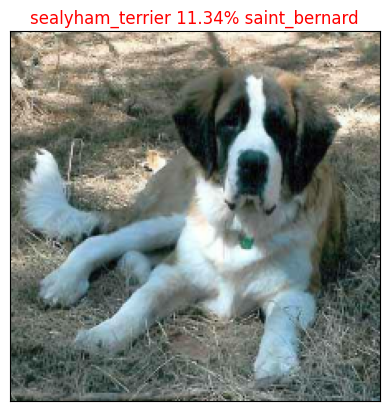

In [43]:
plot_pred(predictions, val_labels, val_images, n=75)

 lets make funcion to view our models top 10 predictions

This function will:

- Take an input od prediction probabilities array and a ground truth array and an intiger

- Find the prediction using get_pred_label

- Find the top 10

- Prediction probabilities indexes
- Prediction probabilities values
- Prediction labels
- Plot the top 10 prediction probability values and labels, coloring the true label green

In [44]:
def plot_pred_conf(prediction_probabilities, labels, n=0):
    """
    Plus the top 10 highest prediction confidences along with the truth label for sample n.
    """
    # Extract prediction probability and true label for the given sample
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation="vertical")

    # Change color of true label if it is among the top 10 predicted labels
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

    # Show the plot
    plt.show()



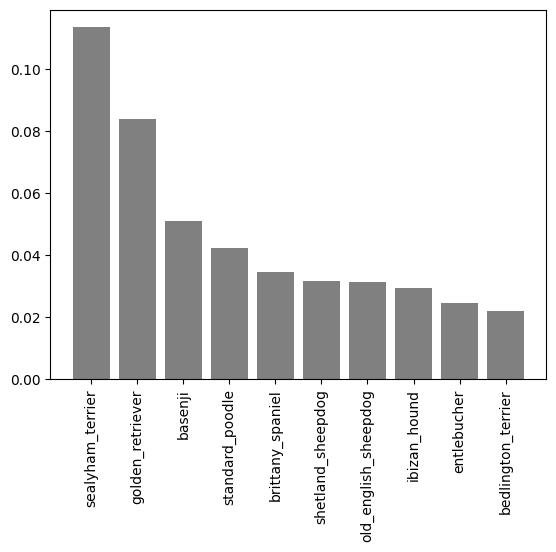

In [45]:
plot_pred_conf(predictions, val_labels, n=75)

Now we ve got some function to help us visualize our predictions and evaluate our model, lets check out

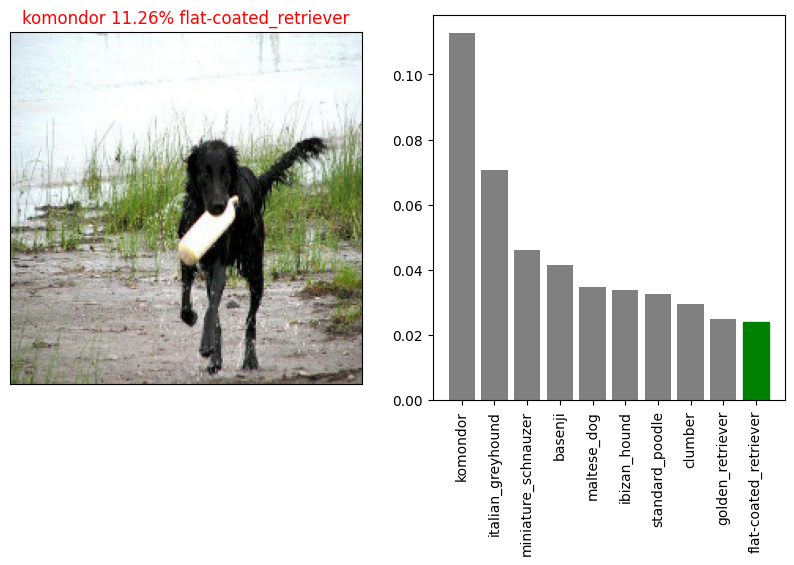

<Figure size 640x480 with 0 Axes>

In [48]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 1
num_cols = 1
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                   labels=val_labels,
                   n=i+i_multiplier)


plt.tight_layout(h_pad=2.0)
plt.show()

# Saving and reloading a trained model

In [49]:
def save_model(model, suffix=None):
    """
  Saves a given model in a models directory and appends a suffix (string).
    """
    # Create a model directory pathname with current time
    modeldir = os.path.join("/content/drive/MyDrive/SDA Final projects/models",
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))

    # Define the model path with a suffix
    model_path = modeldir + "_" + suffix + ".h5"

    # Print the path where the model will be saved
    print(f"Saving model to: {model_path}...")

    # Save the model
    model.save(model_path)

    # Return the path to the saved model
    return model_path


In [50]:
def load_model(model_path):
    """
    Loads a saved model from a specified path.
    """
    # Print the path from which the model will be loaded
    print(f"Loading saved model from: {model_path}")

    # Load the model using TensorFlow's built-in function
    model = tf.keras.models.load_model(model_path,
                                       custom_objects={"KerasLayer": hub.KerasLayer})

    return model


Now we ve got functions to save and load a trained model, lets make sure they work!

In [54]:
# Save our model trained on 1000 images
#save_model(model, suffix="1000-images-mobilenet")

In [51]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/SDA Final projects/models/20240317-13421710682932_1000-images-mobilenet.h5")

Loading saved model from: /content/drive/MyDrive/SDA Final projects/models/20240317-13421710682932_1000-images-mobilenet.h5


In [52]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.9819 - accuracy: 0.4900


[1.9819456338882446, 0.49000000953674316]

# Training a full model

In [53]:
len(X), len(y)

(10222, 10222)

In [54]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [55]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [56]:
# Create a model for full model
full_model = create_model()

Building model with: <keras.src.engine.functional.Functional object at 0x7c8ed21d0a90>


In [57]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=5)

In [62]:
# Fit the full model to the full data
#full_model.fit(x=full_data,
              # epochs=NUM_EPOCHS,
              # callbacks=[full_model_tensorboard, full_model_early_stopping])

In [63]:
# Save full model
#save_model(full_model, suffix="full-image-set-mobilnet")

In [58]:
# Load full model
loaded_full_model = load_model("/content/drive/MyDrive/SDA Final projects/models/20240317-16231710692608_full-image-set-mobilnet.h5")

Loading saved model from: /content/drive/MyDrive/SDA Final projects/models/20240317-16231710692608_full-image-set-mobilnet.h5


# Making predictions on the test dataset

- Get the test image filenames.
- Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True
- Make predictions array by passing the test batches to the predict() method called on our model.

In [59]:
# Load test image filenames
test_path = "/content/drive/MyDrive/SDA Final project/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/SDA Final project/test/eceb457b878bc73e565b0efa002d5563.jpg',
 '/content/drive/MyDrive/SDA Final project/test/f0311d1414f9ce10cffda4c207c108dc.jpg',
 '/content/drive/MyDrive/SDA Final project/test/eea702cbf858b2444129d0ba9eebd6ef.jpg',
 '/content/drive/MyDrive/SDA Final project/test/e9fda9f4a21d4249b9d4a77d06ad751a.jpg',
 '/content/drive/MyDrive/SDA Final project/test/ed48b89faa9069c700db2448696a97af.jpg',
 '/content/drive/MyDrive/SDA Final project/test/e8914f74848c23b70b520887b3ff2e8a.jpg',
 '/content/drive/MyDrive/SDA Final project/test/e8232c9a79f0e77e9b4c5fca60682d41.jpg',
 '/content/drive/MyDrive/SDA Final project/test/f15aa6a53c9de861f8de243d6b437b90.jpg',
 '/content/drive/MyDrive/SDA Final project/test/f446eac396b0e74af84fab5069d28c68.jpg',
 '/content/drive/MyDrive/SDA Final project/test/e96f1f52395b7e742fb5d83e1ac023b7.jpg']

In [60]:
len(test_filenames)

10357

In [61]:
# Create test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [62]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [141]:
# Make predictions on test data batch using the loaded full model
#test_predictions = loaded_full_model.predict(test_data,
#                                             verbose=1)

In [142]:
#test_predictions[:10]

In [143]:
# Save predictions (NumPy array) to csv file (for access later)
#np.savetxt("drive/MyDrive/SDA Final project/preds_array2.csv", test_predictions, delimiter=",")

In [63]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/SDA Final project/preds_array2.csv", delimiter=",")

# Preparing test dataset predictions for Kaggle (Late submission)

Looking at the Kaggle sample submision, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

To get the data in this format, well:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image IDs from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle

In [64]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))

# Append test image IDs to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,eceb457b878bc73e565b0efa002d5563,6.819683e-13,4.340829e-09,1.001932e-10,8.119482e-10,2.435249e-09,1.252498e-08,6.669811e-11,3.137345e-10,1.827721e-02,...,2.882485e-13,6.447732e-11,3.632876e-11,2.059836e-04,1.692244e-11,9.530396e-01,3.471525e-10,2.378189e-08,1.606319e-06,1.140357e-10
1,f0311d1414f9ce10cffda4c207c108dc,1.501110e-09,1.359764e-04,4.506087e-08,7.015651e-05,1.722581e-05,1.560255e-06,3.037180e-06,5.233416e-05,6.745779e-05,...,3.646921e-08,8.247121e-08,1.112572e-02,6.573884e-03,5.647778e-04,3.301717e-06,1.059378e-09,3.890046e-03,6.315639e-06,3.231113e-04
2,eea702cbf858b2444129d0ba9eebd6ef,1.444691e-09,8.241642e-06,1.250531e-06,9.547009e-09,4.681429e-11,4.716250e-10,5.066992e-10,4.650470e-10,5.737480e-11,...,5.608415e-13,7.251639e-14,8.180456e-09,3.863988e-10,1.247551e-09,4.053999e-10,8.766230e-12,1.501477e-04,6.049391e-09,9.735404e-12
3,e9fda9f4a21d4249b9d4a77d06ad751a,2.155150e-11,1.299580e-11,6.179690e-11,9.558189e-08,9.873612e-05,2.079206e-02,2.725126e-10,2.925000e-06,9.087954e-10,...,2.827780e-11,1.971151e-07,9.418289e-10,2.585936e-04,1.663252e-09,1.547319e-10,3.373737e-10,1.946968e-07,4.605084e-05,3.257774e-10
4,ed48b89faa9069c700db2448696a97af,2.038334e-08,1.580298e-07,7.620388e-09,3.846859e-06,5.202954e-04,1.092153e-06,9.118049e-06,1.963321e-02,6.775591e-04,...,2.545317e-04,2.459715e-03,8.589826e-01,4.444115e-05,1.637873e-05,4.027239e-06,4.651005e-09,5.440915e-04,2.934501e-06,5.834848e-03


In [146]:
# Save our predictions dataframe to CSV for submission to Kaggle
#preds_df.to_csv("drive/MyDrive/SDA Final project/full_model_predictions_submission.csv",
 #               index=False)

my score after uploading on kaggle was 0,81299, there were pubished 1280 scores, with score from  0,00 to 34,29....my score was in 792. place

# Making predictions on custom images

To make predictions on custom images,i need:

* Get the filepaths of my own images
* Turn the filepaths into data batches using create_data_batches(). And since my custom images wont have labels, we set the test_data parameter to True.
* Pass the custom image data batch to my predict() method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [65]:
# Get custom images filepaths
custom_path = "drive/MyDrive/SDA Final project/my photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [66]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 3s 3s/step


In [67]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]


In [68]:
# Get custom images (our unbatchify() function wont work since there arent labels...)
custom_images = []
# Loop through unbatches data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

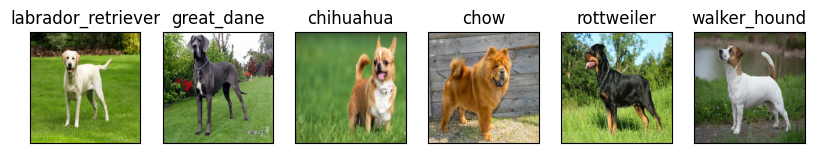

In [69]:
# Check custom image predictions

plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 6, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

# Gradio

In [70]:
pip install gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 36.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.9/91.9 kB 11.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.4/313.4 kB 36.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.8/144.8 kB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 100.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 10.8 MB/s eta 0:00:00
  Created wheel for ffmpy: filename=ffmpy-0.3.2-py3-none-any.whl 

In [71]:
import gradio as gr
from PIL import Image
import numpy as np
import tensorflow as tf

# Load your trained model
model = tf.keras.models.load_model("/content/drive/MyDrive/SDA Final projects/models/20240317-16231710692608_full-image-set-mobilnet.h5")

# Define a function to preprocess the input image
def preprocess_image(image):
    # Convert the image to a PIL image
    image_pil = Image.fromarray(np.uint8(image))
    # Resize the image to match the input size expected by your model
    image_resized = image_pil.resize((224, 224))
    # Convert the resized image to a numpy array
    image_array = np.asarray(image_resized)
    # Normalize the pixel values to be in the range [0, 1]
    image_array = image_array / 255.0
    # Expand the dimensions to match the shape expected by your model
    image_array = np.expand_dims(image_array, axis=0)
    return image_array

def classify_dog_breed(image):
    # Preprocess the input image
    preprocessed_image = preprocess_image(image)
    # Make predictions using your model
    predictions = model.predict(preprocessed_image)
    # Get the predicted dog breed (class with highest probability)
    predicted_index = np.argmax(predictions)
    predicted_confidence = predictions[0, predicted_index]
    predicted_label = unique_breeds[predicted_index]
    return {predicted_label: predicted_confidence}

# Define the input component (file uploader)
input_component = gr.Image(label="Upload an image of a dog")

# Define the output component (text label)
output_component = gr.Label(label="Predicted Breed")

# Create a Gradio interface
gr.Interface(
    fn=classify_dog_breed,
    inputs=input_component,
    outputs=output_component,
    title="Dog Breed Classifier",
    description="Upload an image of a dog to classify its breed."
).launch(debug=True)

Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://8a2267dc028c3dd31f.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


1/1 [==============================] - 0s 21ms/step
Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://8a2267dc028c3dd31f.gradio.live
